In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


##### import data

In [38]:
#I am interested in renting apartment data 

rent11 = pd.read_csv('apartments_rent_pl_2023_11.csv')
rent11 = rent11.assign(date='November 2023')

rent12 = pd.read_csv('apartments_rent_pl_2023_12.csv')
rent12 = rent12.assign(date='December 2023')

df = pd.concat([rent11, rent12])
df.head()

,id,city,type,squareMeters,rooms,floor,floorCount,buildYear,latitude,longitude,...,ownership,buildingMaterial,condition,hasParkingSpace,hasBalcony,hasElevator,hasSecurity,hasStorageRoom,price,date
0,2a1a6db97ff122d6bc148abb6f0e498a,szczecin,blockOfFlats,52.0,2.0,3.0,3.0,2008.0,53.460535,14.545416,...,condominium,brick,NaN,yes,yes,no,no,no,3500,November 2023
1,5a0cb42c088eadf75aa98a4118640048,szczecin,blockOfFlats,57.0,3.0,NaN,10.0,1976.0,53.440955,14.566024,...,condominium,NaN,premium,no,yes,yes,no,no,3000,November 2023
2,996722490efcb4b34d48bb84a9a72838,szczecin,NaN,43.4,2.0,3.0,4.0,NaN,53.435746,14.560764,...,condominium,NaN,NaN,no,yes,no,no,no,1900,November 2023
3,50d75c688530b9a61ba505301e0b94a9,szczecin,apartmentBuilding,32.6,2.0,5.0,6.0,2021.0,53.421582,14.541572,...,condominium,brick,premium,no,yes,yes,no,no,2500,November 2023
4,9b187f4203adabf466fd08610d8f4e5e,szczecin,apartmentBuilding,72.0,3.0,6.0,6.0,2014.0,53.450010,14.547230,...,condominium,brick,premium,no,yes,yes,no,yes,2999,November 2023


In [3]:
# let's check the data type and whether there are empty values
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17405 entries, 0 to 8871
Data columns (total 29 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    17405 non-null  object 
 1   city                  17405 non-null  object 
 2   type                  12844 non-null  object 
 3   squareMeters          17405 non-null  float64
 4   rooms                 17405 non-null  float64
 5   floor                 15339 non-null  float64
 6   floorCount            17024 non-null  float64
 7   buildYear             12078 non-null  float64
 8   latitude              17405 non-null  float64
 9   longitude             17405 non-null  float64
 10  centreDistance        17405 non-null  float64
 11  poiCount              17405 non-null  float64
 12  schoolDistance        17398 non-null  float64
 13  clinicDistance        17387 non-null  float64
 14  postOfficeDistance    17396 non-null  float64
 15  kindergartenDistance

##### null values

In [25]:
#pip install missingno


Note: you may need to restart the kernel to use updated packages.Requirement already satisfied: missingno in c:\users\julia\anaconda3\lib\site-packages (0.5.2)



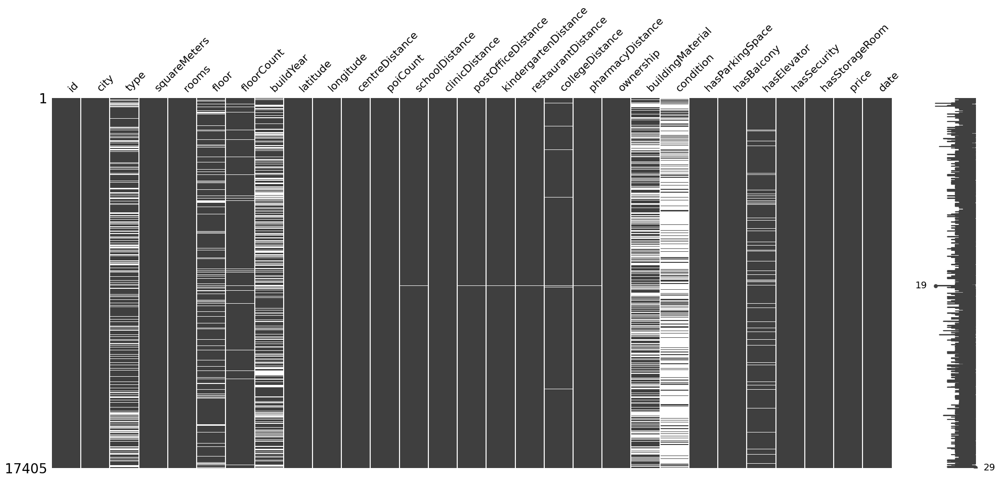

In [16]:
# let's check where and how much data is missing
import missingno as msno

msno.matrix(df)
plt.show()

In [5]:
correlation_matrix = df.corr()

correlation_with_target = correlation_matrix['price']
print(correlation_with_target)

squareMeters            0.750544
rooms                   0.633215
floor                   0.082953
floorCount              0.077132
buildYear               0.012147
latitude                0.081209
longitude               0.328273
centreDistance          0.017063
poiCount                0.172834
schoolDistance         -0.068981
clinicDistance         -0.148736
postOfficeDistance     -0.062178
kindergartenDistance   -0.074320
restaurantDistance     -0.147998
collegeDistance        -0.077745
pharmacyDistance       -0.059552
price                   1.000000
Name: price, dtype: float64


C:\Users\julia\AppData\Local\Temp\ipykernel_10960\3103532779.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()


In [ ]:
print(df['ownership'].nunique())

In [39]:
# Several columns have a lot of missing values. Maybe a good option would be to remove them.
# Features such as the year of construction are much less important than, for example, the number of rooms
# For now, let's just save the sparse columns as rare_columns

rare_columns = ['type', 'floor', 'floorCount', 'buildYear', 'buildingMaterial','condition','hasElevator',
                'schoolDistance', 'clinicDistance','kindergartenDistance','restaurantDistance','collegeDistance',
                'pharmacyDistance','postOfficeDistance','ownership']
df.drop(columns=rare_columns, inplace=True)

In [8]:
df.head()

,id,city,squareMeters,rooms,floor,floorCount,latitude,longitude,centreDistance,poiCount,...,collegeDistance,pharmacyDistance,ownership,hasParkingSpace,hasBalcony,hasElevator,hasSecurity,hasStorageRoom,price,date
0,2a1a6db97ff122d6bc148abb6f0e498a,szczecin,52.0,2.0,3.0,3.0,53.460535,14.545416,4.26,2.0,...,2.200,0.307,condominium,yes,yes,no,no,no,3500,November 2023
1,5a0cb42c088eadf75aa98a4118640048,szczecin,57.0,3.0,NaN,10.0,53.440955,14.566024,1.98,14.0,...,1.323,0.189,condominium,no,yes,yes,no,no,3000,November 2023
2,996722490efcb4b34d48bb84a9a72838,szczecin,43.4,2.0,3.0,4.0,53.435746,14.560764,1.37,17.0,...,0.714,0.211,condominium,no,yes,no,no,no,1900,November 2023
3,50d75c688530b9a61ba505301e0b94a9,szczecin,32.6,2.0,5.0,6.0,53.421582,14.541572,1.30,16.0,...,0.689,0.192,condominium,no,yes,yes,no,no,2500,November 2023
4,9b187f4203adabf466fd08610d8f4e5e,szczecin,72.0,3.0,6.0,6.0,53.450010,14.547230,3.10,11.0,...,1.387,0.315,condominium,no,yes,yes,no,yes,2999,November 2023


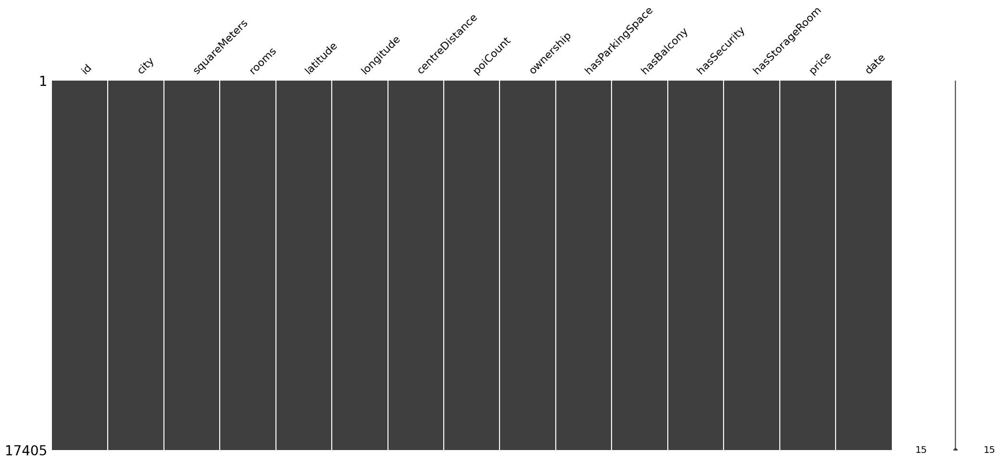

In [22]:
msno.matrix(df)
plt.show()


##### EDA

In [28]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
squareMeters,17405.0,56.508959,22.991839,25.000000,40.000000,50.000000,65.940000,150.000000
rooms,17405.0,2.431083,0.876825,1.000000,2.000000,2.000000,3.000000,6.000000
floor,15339.0,3.506422,2.734314,1.000000,2.000000,3.000000,4.000000,25.000000
floorCount,17024.0,5.775905,3.592175,1.000000,4.000000,5.000000,7.000000,29.000000
buildYear,12078.0,1997.785809,29.942363,1850.000000,1981.000000,2009.000000,2019.000000,2023.000000
latitude,17405.0,51.903524,1.184122,49.982150,51.111676,52.194157,52.257060,54.581756
longitude,17405.0,19.684616,1.701088,14.447127,18.627150,19.960500,21.007074,23.184586
centreDistance,17405.0,3.869721,2.644133,0.020000,1.750000,3.380000,5.510000,16.360000
poiCount,17405.0,25.280839,26.524507,0.000000,9.000000,17.000000,31.000000,199.000000
schoolDistance,17398.0,0.368368,0.358878,0.002000,0.173000,0.283000,0.444000,4.818000


##### WARSAW

In [40]:
#filtering
city_filter = df['city'] == 'warszawa'
#price_filter = df_newCol['price'] < 5000
#rooms_filter = df_newCol['rooms'] > 1
#meterage_filter = df_newCol['squareMeters']>20

# Create a new df_Warsaw data frame with selected rows
df_filtered = df[city_filter].copy()
#& price_filter & rooms_filter & meterage_filter

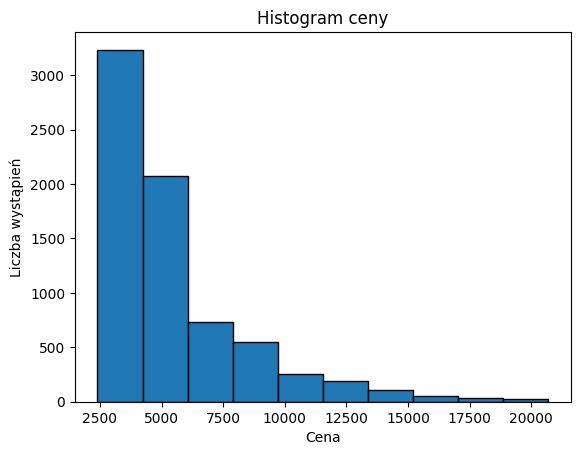

In [41]:
df_filtered['price'].plot(kind='hist', bins=10, edgecolor='black')

# Dodanie etykiet i tytułu
plt.xlabel('Cena')
plt.ylabel('Liczba wystąpień')
plt.title('Histogram ceny')

# Wyświetlenie histogramu
plt.show()

##### on map

In [32]:
#pip install folium

Note: you may need to restart the kernel to use updated packages.


In [28]:
import folium as folium

m = folium.Map(location=[52.237, 21.017], zoom_start=12)


# Adding points to the map
for index, row in df_filtered.iterrows():
    # Uzyskiwanie koloru z palety viridis w zakresie [0, 1]
    color = sns.color_palette("viridis", as_cmap=True)(row['price'] / df_filtered['price'].max())
    
    # Zamiana koloru na format heksadecymalny
    hex_color = "#{:02x}{:02x}{:02x}".format(int(color[0]*255), int(color[1]*255), int(color[2]*255))

    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=10,
        popup=f"Price: {row['price']}",
        color=hex_color,
        fill=True,
        fill_color=hex_color,
        fill_opacity=0.7,
    ).add_to(m)

# Wyświetlanie mapy
m


<Axes: xlabel='longitude', ylabel='latitude'>

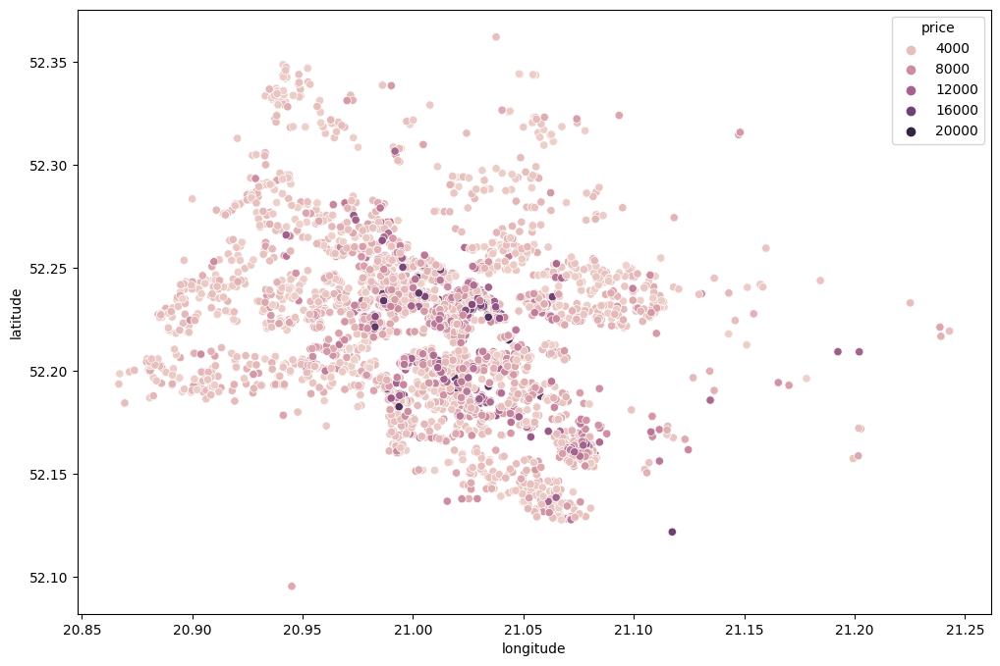

In [29]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='longitude',y='latitude',data=df_filtered,hue='price')

In [32]:
df_filtered.head()

,id,city,squareMeters,rooms,latitude,longitude,centreDistance,poiCount,ownership,hasParkingSpace,hasBalcony,hasSecurity,hasStorageRoom,price,date
4660,523744ecb14f504e567324fcad116cde,warszawa,47.0,2.0,52.257912,20.968610,3.76,33.0,condominium,yes,yes,no,no,5000,November 2023
4661,62b928458d945b2eb9e5a8b94c29d6b9,warszawa,27.0,1.0,52.249800,21.035200,2.95,33.0,condominium,yes,yes,no,no,2950,November 2023
4662,ce250f3900a285305906baf45f5f8858,warszawa,51.0,2.0,52.222864,21.009959,1.08,85.0,condominium,no,yes,no,no,3700,November 2023
4663,eace41af111d8fc16c0b69d0f2a22ec5,warszawa,50.0,3.0,52.224948,21.012136,0.95,124.0,condominium,no,no,no,no,5000,November 2023
4664,66c8701beef1ffbba137456cef6b5271,warszawa,39.8,2.0,52.216513,21.041474,3.09,6.0,condominium,no,no,no,no,4500,November 2023


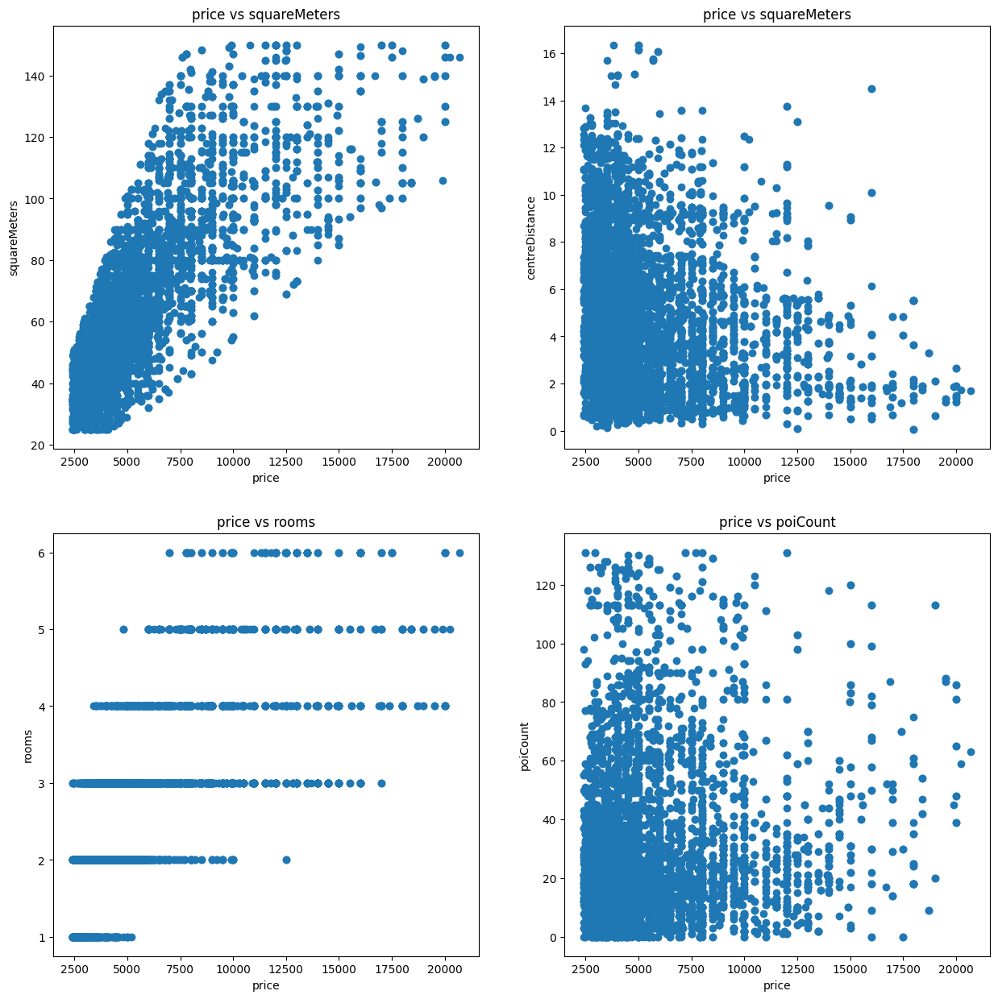

In [43]:
import matplotlib.pyplot as plt

# Tworzenie trzech wykresów obok siebie
plt.figure(figsize=(15, 15))

# Wykres 1
plt.subplot(2, 2, 1)
plt.scatter(df_filtered['price'], df_filtered['squareMeters'])
plt.xlabel('price')
plt.ylabel('squareMeters')
plt.title('price vs squareMeters')

# Wykres 2
plt.subplot(2, 2, 2)
# Dodaj kolejny wykres lub zmień dane, jakie chcesz przedstawić
plt.scatter(df_filtered['price'], df_filtered['centreDistance'])
plt.xlabel('price')
plt.ylabel('centreDistance')
plt.title('price vs squareMeters')

# Wykres 3
plt.subplot(2, 2, 3)
# Dodaj kolejny wykres lub zmień dane, jakie chcesz przedstawić
plt.scatter(df_filtered['price'], df_filtered['rooms'])
plt.xlabel('price')
plt.ylabel('rooms')
plt.title('price vs rooms')

#wykres 4
plt.subplot(2, 2, 4)
# Dodaj kolejny wykres lub zmień dane, jakie chcesz przedstawić
plt.scatter(df_filtered['price'], df_filtered['poiCount'])
plt.xlabel('price')
plt.ylabel('poiCount')
plt.title('price vs poiCount')

# Wyświetlanie wykresów
plt.show()


In [45]:
df_filtered.drop(columns=['city'],inplace=True)

In [47]:
# Eksport do pliku CSV
df_filtered.to_csv('Warsaw_rent_cleaned.csv', index=False)
